In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('../input/new-york-city-airbnb-open-data/AB_NYC_2019.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [3]:
# target variable reviews_per_month 

In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                48895 non-null int64
name                              48879 non-null object
host_id                           48895 non-null int64
host_name                         48874 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       38843 non-null object
reviews_per_month                 38843 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64

In [5]:
df['neighbourhood_group'].value_counts(normalize=True)

Manhattan        0.443011
Brooklyn         0.411167
Queens           0.115881
Bronx            0.022313
Staten Island    0.007629
Name: neighbourhood_group, dtype: float64

In [6]:
df.sort_values(by='reviews_per_month', 
        ascending=False).head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
42075,32678719,Enjoy great views of the City in our Deluxe Room!,244361589,Row NYC,Manhattan,Theater District,40.75918,-73.98801,Private room,100,1,156,2019-07-07,58.50,9,299
42076,32678720,Great Room in the heart of Times Square!,244361589,Row NYC,Manhattan,Theater District,40.75828,-73.98876,Private room,199,1,82,2019-07-07,27.95,9,299
38870,30423106,Lou's Palace-So much for so little,228415932,Louann,Queens,Rosedale,40.65417,-73.74158,Private room,45,1,37,2019-07-08,20.94,1,134
27287,21550302,JFK Comfort.5 Mins from JFK Private Bedroom & ...,156684502,Nalicia,Queens,Springfield Gardens,40.66110,-73.76830,Private room,80,1,403,2019-07-06,19.75,3,26
28651,22176831,JFK 2 Comfort 5 Mins from JFK Private Bedroom,156684502,Nalicia,Queens,Springfield Gardens,40.66158,-73.77050,Private room,50,1,341,2019-07-08,17.82,3,25


In [7]:
#average number of views per month
rpw_Mean = df['reviews_per_month'].mean()

In [8]:
df['price'].mean()

152.7206871868289

In [9]:
df['minimum_nights'].mean()

7.029962163820431

In [10]:
df['availability_365'].mean()

112.78132733408324

In [11]:
df[df['reviews_per_month']<rpw_Mean].mean()

id                                1.613322e+07
host_id                           4.963208e+07
latitude                          4.072872e+01
longitude                        -7.395526e+01
price                             1.458266e+02
minimum_nights                    7.456929e+00
number_of_reviews                 1.139741e+01
reviews_per_month                 4.272440e-01
calculated_host_listings_count    5.015805e+00
availability_365                  9.594806e+01
dtype: float64

In [12]:
print(df[df['reviews_per_month']>=rpw_Mean].mean())
df[df['reviews_per_month']>=rpw_Mean].mean().shape

id                                2.182074e+07
host_id                           9.194878e+07
latitude                          4.072702e+01
longitude                        -7.394334e+01
price                             1.356620e+02
minimum_nights                    2.853968e+00
number_of_reviews                 6.325418e+01
reviews_per_month                 3.167742e+00
calculated_host_listings_count    5.446450e+00
availability_365                  1.508023e+02
dtype: float64


(10,)

In [13]:
pd.crosstab(df['reviews_per_month']>=rpw_Mean, df['minimum_nights']>=7.029962163820431)
#квартиры с большым минимальным размером брони и большим количеством просмотров - меньшинство, и наоборот, с большой минимальной бронью и 

minimum_nights,False,True
reviews_per_month,,
False,28491,6996
True,13071,337


In [14]:
pd.crosstab(df['reviews_per_month']>=rpw_Mean, df['price']>=152.7206871868289)
#вполне ожидаемый результат. дешевых и просматриваемых квартир больше  если цена ниже

price,False,True
reviews_per_month,,
False,24272,11215
True,9744,3664


In [15]:
pd.crosstab(df['reviews_per_month']>=rpw_Mean, df['availability_365']>=112.78132733408324)
#непостоянно доступных и редко просматриваемых квартир значительно больше, чем прочих. 
#Но среди часто просматриваемых квартир - постоянно доступных квартир несколько больше.

availability_365,False,True
reviews_per_month,,
False,24001,11486
True,6273,7135


In [16]:
columns_to_show = ['price', 'minimum_nights', 'availability_365']

df.groupby([df['reviews_per_month']>=rpw_Mean])[columns_to_show].agg([np.mean, np.std, np.min, np.max])
#зависимость популярности от цены не значительная
#зависимость популярности от минимального размера брони значима
#зависимость популярности от доступности заметная.

price                         minimum_nights  \
                         mean         std amin   amax           mean   
reviews_per_month                                                      
False              159.165948  269.069846    0  10000       8.607772   
True               135.661993  135.292302    0   7500       2.853968   

                                        availability_365                        
                         std amin  amax             mean         std amin amax  
reviews_per_month                                                               
False              23.537391    1  1250        98.415927  132.794192    0  365  
True                6.617647    1   365       150.802282  120.472478    0  365

In [17]:
df.pivot_table(['reviews_per_month', 'price', 'minimum_nights', 'availability_365'], 
['neighbourhood_group'], aggfunc='mean').head(10)
# более популярное жильё в Bronx, Queens, и в Staten Island, менее популярное в Manhattan и в Brooklyn
# жильё в популярных районах в среднем дешевле чем в непопулярных
# жильё в популярных районах в среднем имеет меньший минимальный размер брони чем в непопулярных
# жильё в популярных районах в среднем имеет большую круглогодичную доступность, чем в непопулярных

,availability_365,minimum_nights,price,reviews_per_month
neighbourhood_group,,,,
Bronx,165.758937,4.560953,87.496792,1.837831
Brooklyn,100.232292,6.056556,124.383207,1.283212
Manhattan,111.979410,8.579151,196.875814,1.272131
Queens,144.451818,5.181433,99.517649,1.941200
Staten Island,199.678284,4.831099,114.812332,1.872580


In [18]:
df.pivot_table(['reviews_per_month', 'price', 'minimum_nights', 'availability_365'], 
['room_type'], aggfunc='mean').head(10)
#популярность жилья не значительно зависит от типа 
#снять дом/квартиру дороже чем комнату, приватная комната немного дороже общей
#Минимальный срок аренды дома/квартиры больше чем комнаты,
#круглогодичная доступность общих комнат в среднем больше, чем у квартир и отдельных комнат.

,availability_365,minimum_nights,price,reviews_per_month
room_type,,,,
Entire home/apt,111.920304,8.506907,211.794246,1.306578
Private room,111.203933,5.377900,89.780973,1.445209
Shared room,162.000862,6.475000,70.127586,1.471726


In [19]:
#FE

df['reviews_per_host'] = df['number_of_reviews'] / df['calculated_host_listings_count']

In [20]:
import warnings
warnings.simplefilter('ignore')

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'svg' 

from pylab import rcParams
rcParams['figure.figsize'] = 8, 5

In [21]:
df.shape

(48895, 17)

In [22]:
df.dropna()
df.shape

(48895, 17)

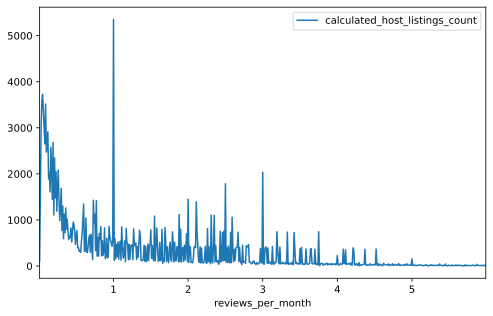

In [23]:
popularity_df = df[['calculated_host_listings_count'] + ['reviews_per_month']]
popularity_df = popularity_df[popularity_df['reviews_per_month']<6]
popularity_df.groupby('reviews_per_month').sum().plot()

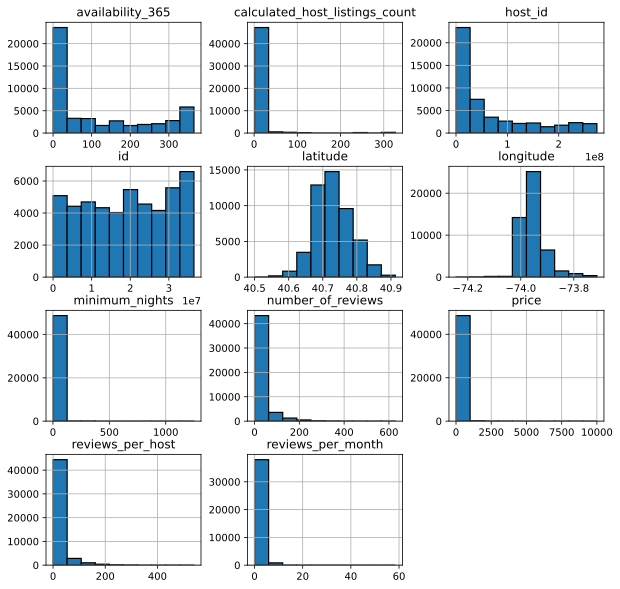

In [24]:
df.hist(edgecolor="black", linewidth=1.2, figsize=(10, 10))
plt.show()

In [25]:
pd.crosstab(df['room_type'], df['neighbourhood_group'], margins=True)

neighbourhood_group,Bronx,Brooklyn,Manhattan,Queens,Staten Island,All
room_type,,,,,,
Entire home/apt,379,9559,13199,2096,176,25409
Private room,652,10132,7982,3372,188,22326
Shared room,60,413,480,198,9,1160
All,1091,20104,21661,5666,373,48895


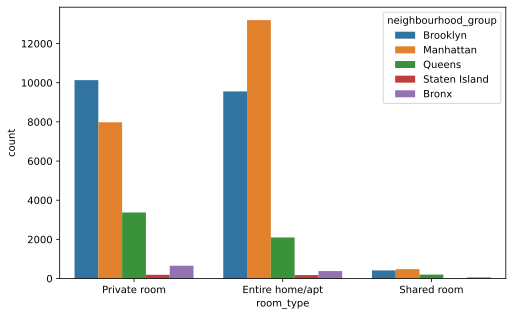

In [26]:
sns.countplot(x='room_type', hue='neighbourhood_group', data=df);

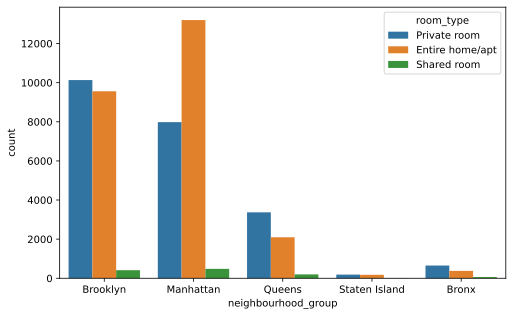

In [27]:
sns.countplot(x='neighbourhood_group', hue='room_type', data=df);

In [28]:
#the standard deviation of parameters in groups is large, so the grouping method is unsuccessful.
def drop_excess_stast(stat):
    stat.drop(index="count", inplace=True);
    stat.drop(index="25%", inplace=True);
    stat.drop(index="50%", inplace=True);
    stat.drop(index="75%", inplace=True);
    stat.drop(index="min", inplace=True);
    stat.drop(index="max", inplace=True);
    stat.drop(columns=["host_id"], inplace=True);
    stat.drop(columns=["latitude"], inplace=True);
    stat.drop(columns=["longitude"], inplace=True);
    return stat;

for i in df["neighbourhood_group"].unique():
    print (i)
    for j in df["room_type"].unique():
        print(j);
        df_i_j = df[(df['room_type']==j) & (df['neighbourhood_group']==i)]
        stat = drop_excess_stast(df_i_j.describe());               
        
        print(stat)
        
        

Brooklyn
Private room
                id       price  minimum_nights  number_of_reviews  \
mean  1.894125e+07   76.500099        5.539479          21.086952   
std   1.053306e+07  124.713499       17.823096          41.567403   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.255758                        2.547177         99.917983   
std            1.538671                        4.866193        128.812339   

      reviews_per_host  
mean         12.720450  
std          28.080256  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.730117e+07  178.327545        6.531332          27.945183   
std   1.105914e+07  226.415825       17.629627          47.303490   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.317630                        1.837849         97.205147   
std            1.505286                        5.471804        121.034159   

      r

In [29]:
#lets try let's try to make smaller groups
#it was found that in some areas there are no offers for rental housing
#when viewing housing parameters, it is found that the spread of parameters within 
#neighborhoods is sometimes significantly less than within groups of neighborhoods. 
#Theoretically, this can be used to improve the model.

print("empty neighbourhood and house types grups:");
for i in df["neighbourhood"].unique():
    for j in df["room_type"].unique():
        if df[(df['room_type']==j) & (df['neighbourhood']==i)].shape[0]==0:
            print(i + "+" + j)

for i in df["neighbourhood"].unique():
    print (i)
    for j in df["room_type"].unique():        
        df_i_j = df[(df['room_type']==j) & (df['neighbourhood']==i)]
        if(df_i_j.shape[0]!=0):
            stat = drop_excess_stast(df_i_j.describe())            
            print(j);
            print(stat)
        

empty neighbourhood and house types grups:
Windsor Terrace+Shared room
Prospect Heights+Shared room
Brooklyn Heights+Shared room
Carroll Gardens+Shared room
Cobble Hill+Shared room
DUMBO+Shared room
St. George+Shared room
Highbridge+Shared room
Middle Village+Shared room
NoHo+Shared room
Flatiron District+Shared room
Tompkinsville+Shared room
Two Bridges+Shared room
Rockaway Beach+Shared room
Allerton+Shared room
Emerson Hill+Shared room
Tribeca+Shared room
Shore Acres+Shared room
Concourse+Shared room
St. Albans+Shared room
Arrochar+Shared room
Graniteville+Shared room
Spuyten Duyvil+Shared room
Stapleton+Shared room
Columbia St+Shared room
Mott Haven+Shared room
Civic Center+Shared room
New Springville+Shared room
Cambria Heights+Shared room
Tottenville+Shared room
Mariners Harbor+Shared room
Bayside+Shared room
Downtown Brooklyn+Shared room
College Point+Shared room
Mount Eden+Shared room
City Island+Shared room
Glendale+Shared room
Port Richmond+Shared room
Williamsbridge+Shared ro

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.534812e+07  243.982659        6.231214          26.005780   
std   1.079731e+07  602.097613       20.366889          49.053712   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.027071                        1.395954         86.005780   
std            1.310591                        1.483000        122.199219   

      reviews_per_host  
mean         22.138412  
std          43.059826  
Shared room
                id     price  minimum_nights  number_of_reviews  \
mean  2.446420e+07  49.00000        2.111111          25.666667   
std   1.280755e+07  19.48076        1.536591          64.430195   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.465000                        3.444444        155.888889   
std            2.533115                        2.455153        180.462908   

      reviews_per_host 

Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  1.762942e+07  95.225000        2.575000          30.725000   
std   1.043945e+07  83.983969        4.623726          50.860789   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.632609                        1.575000        102.100000   
std            1.345133                        0.957762        132.176223   

      reviews_per_host  
mean         19.941667  
std          40.727078  
Chinatown
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  1.819161e+07  95.006410        4.679487          29.564103   
std   9.885334e+06  31.428259        6.788023          49.397163   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.491912                        1.769231         82.435897   
std            1.854104                        1.348099        113.074065   

      reviews_pe

Private room
                id       price  minimum_nights  number_of_reviews  \
mean  1.986358e+07  156.741007        4.910072          33.438849   
std   1.114858e+07  283.777747       13.324979          60.412495   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.701395                        3.733813        114.830935   
std            1.841061                        5.893857        139.975772   

      reviews_per_host  
mean         23.679659  
std          52.987187  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.850965e+07  283.262195       11.887805          17.125610   
std   1.162013e+07  343.269770       28.086420          33.665344   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.090346                       20.770732        112.445122   
std            1.329269                       59.132154        133.971005   

      reviews_pe

Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.433313e+07  65.705882       13.647059           4.882353   
std   5.028120e+06  47.383759       14.172778           8.608734   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           0.453000                       11.294118        257.058824   
std            0.486165                       10.901632        135.406089   

      reviews_per_host  
mean          1.164706  
std           1.875814  
Bushwick
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.025790e+07  62.623037        5.317045          18.075625   
std   1.001999e+07  57.370554       11.227103          39.042797   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.248227                        2.853985         88.202443   
std            1.545691                        7.396407        123.424826   

      reviews_per

Private room
                id       price  minimum_nights  number_of_reviews  \
mean  2.050128e+07  124.991304        5.243478          24.713043   
std   1.134029e+07   59.794311       17.413743          42.096123   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.257097                        2.347826        119.304348   
std            1.418464                        2.119432        133.573830   

      reviews_per_host  
mean         16.389524  
std          31.402701  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.769800e+07  365.618257        6.311203          17.962656   
std   1.155595e+07  343.965277       11.332045          30.318632   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.099479                        3.800830        106.663900   
std            1.248760                       19.193145        127.944353   

      reviews_pe

Private room
                id      price  minimum_nights  number_of_reviews  \
mean  1.710465e+07  92.666667        2.607843          17.372549   
std   1.030522e+07  42.775538        2.898817          24.044925   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.244048                        1.470588         77.058824   
std            1.245065                        0.856807        102.478761   

      reviews_per_host  
mean         13.617647  
std          20.675974  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.447513e+07  199.241758        5.126374          27.532967   
std   1.060953e+07  141.018344        7.236377          44.619032   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.034231                        1.340659         70.159341   
std            1.229824                        0.782682        106.725920   

      reviews_per_h

Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.840803e+07  39.040000        2.320000          10.680000   
std   8.851234e+06  19.846242        1.464013          15.079567   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.492105                        6.360000        230.040000   
std            0.924077                        4.990658        150.803813   

      reviews_per_host  
mean          5.268889  
std           8.785194  
DUMBO
Private room
                id       price  minimum_nights  number_of_reviews  \
mean  1.381814e+07  158.769231        4.615385          56.000000   
std   1.005682e+07   85.404092        5.530800          65.485367   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.724000                        1.153846         88.384615   
std            1.653859                        0.375534        100.042107   

      reviews_per

Private room
                id      price  minimum_nights  number_of_reviews  \
mean  1.947148e+07  61.700000        1.700000          32.800000   
std   1.027673e+07  19.079075        0.674949          32.020133   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.947778                        1.700000        150.000000   
std            1.847233                        0.948683        130.113626   

      reviews_per_host  
mean         18.533333  
std          14.747421  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.909599e+07  132.380952        8.380952          34.619048   
std   1.183785e+07   58.734552       11.011250          44.246442   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.795263                        2.095238        240.047619   
std            2.004269                        1.513432        100.490037   

      reviews_per_h

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.022760e+07  130.855615        4.465241          40.898396   
std   1.025539e+07   78.933928       10.983498          47.311997   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.184386                        1.470588        154.411765   
std            1.769776                        0.893791        128.799571   

      reviews_per_host  
mean         32.625668  
std          39.290805  
Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  1.730717e+07  41.958333       24.833333           3.833333   
std   8.040470e+06  22.351888       20.558859           5.104701   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           0.318333                         4.50000        293.000000   
std            0.687427                         2.55377        127.959233   

      reviews_per_ho

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.304322e+07  103.909091        3.515152          54.151515   
std   9.700332e+06   53.608747        6.888039          55.855909   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean            4.34800                        1.454545        188.969697   
std             2.86082                        0.665719        128.154810   

      reviews_per_host  
mean         47.666667  
std          53.778933  
Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.249196e+07  39.000000             1.0           5.500000   
std   2.101890e+06   2.828427             0.0           7.778175   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean               0.51                        1.500000         62.500000   
std                 NaN                        0.707107         88.388348   

      reviews_per_ho

Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.040425e+07  64.928571        3.000000          20.964286   
std   1.073971e+07  36.299096        5.470459          33.533269   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.085263                        2.285714        122.321429   
std            1.098476                        2.447329        148.791441   

      reviews_per_host  
mean         13.372024  
std          27.158026  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.590391e+07  120.192308       10.769231          23.653846   
std   1.085957e+07   50.119872       16.950062          51.979182   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.110000                        1.961538        114.846154   
std            1.399943                        1.112862         95.479712   

      reviews_per_h

Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.474534e+07  34.842105        4.105263          33.000000   
std   1.087237e+07   9.505923        6.632368          49.249929   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.561333                        6.947368        236.368421   
std            0.887805                        3.117579        141.448935   

      reviews_per_host  
mean          8.890789  
std          15.644872  
Emerson Hill
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  1.814509e+07  71.333333        1.666667           0.666667   
std   1.753770e+07  19.502137        0.577350           1.154701   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean               0.05                             1.0        100.666667   
std                 NaN                             0.0         87.460467   

      reviews

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.205165e+07  133.293103        5.034483          33.827586   
std   9.320996e+06   68.373846        9.662671          40.306344   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.970943                        1.879310        118.051724   
std            1.514964                        1.475859        110.500365   

      reviews_per_host  
mean         18.512069  
std          22.042452  
Shared room
                id     price  minimum_nights  number_of_reviews  \
mean  2.777077e+07  45.75000        1.125000           8.750000   
std   3.399352e+06  29.30992        0.353553           8.564878   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.125714                         2.37500        189.625000   
std            0.976317                         1.06066        123.700026   

      reviews_per_host 

Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.612422e+07  55.322581        1.774194          27.161290   
std   8.966872e+06  25.642916        1.499104          42.411552   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.543333                        1.580645        207.225806   
std            2.025214                        0.992445        147.208177   

      reviews_per_host  
mean         17.112903  
std          28.933045  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.495086e+07  139.388889        6.111111          24.277778   
std   8.549926e+06   93.846645        8.414895          46.863764   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.787857                        1.777778        192.277778   
std            1.686650                        1.165966        135.465996   

      reviews_per_h

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.331984e+07  110.575758        3.000000          27.818182   
std   1.012355e+07   38.471605        1.658312          36.524354   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.812500                        1.818182        157.121212   
std            1.583701                        1.210747        114.249113   

      reviews_per_host  
mean         20.803030  
std          33.031536  
Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  8.011090e+06  31.666667        4.000000           2.666667   
std   6.859967e+06  11.547005        5.196152           4.618802   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean               0.11                        1.333333        121.333333   
std                 NaN                        0.577350        210.155498   

      reviews_per_ho

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.977347e+07  226.428571        9.257143          15.428571   
std   1.082516e+07  163.417957       16.770673          54.221922   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           0.906316                        2.542857         64.457143   
std            1.321730                        8.610332        107.495921   

      reviews_per_host  
mean         15.158242  
std          54.268185  
East Elmhurst
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.380152e+07  61.595238        1.468254          97.071429   
std   9.683626e+06  60.192382        1.170890         139.526008   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           5.335652                        2.896825        165.841270   
std            4.182581                        1.862598        127.048615   

     

Private room
                id      price  minimum_nights  number_of_reviews  \
mean  1.986867e+07  79.400000        2.200000          29.000000   
std   1.263809e+07  68.123417        1.643168          37.403208   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           3.357500                             1.0        183.800000   
std            4.643945                             0.0        123.372201   

      reviews_per_host  
mean         29.000000  
std          37.403208  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.382564e+07  120.000000        2.666667           9.333333   
std   1.622216e+07   36.055513        2.081666           6.110101   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.913333                             1.0        204.333333   
std            1.886063                             0.0         83.727733   

      reviews_per_h

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  1.600824e+07  131.125000        3.250000           2.875000   
std   8.618892e+06   52.523294        2.815772           4.611709   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           0.135000                         1.37500          92.37500   
std            0.110045                         1.06066         136.93579   

      reviews_per_host  
mean          2.687500  
std           4.682319  
Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  1.926875e+07  41.000000        1.333333           9.000000   
std   1.183424e+07   5.291503        0.577350           7.549834   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.150000                             2.0        253.666667   
std            0.736139                             0.0        190.242827   

      reviews_per_ho

Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.632536e+07  49.333333        1.666667           0.666667   
std   7.265257e+06  26.857649        1.154701           0.577350   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           0.525000                        1.333333         59.666667   
std            0.671751                        0.577350        103.345698   

      reviews_per_host  
mean               0.5  
std                0.5  
Richmond Hill
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.305443e+07  58.000000        2.157895          35.561404   
std   9.455899e+06  20.307458        3.945112          78.253256   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.803922                        3.175439         181.00000   
std            2.907898                        2.088427         139.02659   

      review

Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.792883e+07  34.500000             1.0          28.000000   
std   6.531574e+06   0.707107             0.0          24.041631   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           3.590000                             3.0          200.5000   
std            1.315219                             0.0          208.5965   

      reviews_per_host  
mean          9.333333  
std           8.013877  
Woodrow
Entire home/apt
             id  price  minimum_nights  number_of_reviews  reviews_per_month  \
mean  1798271.0  700.0             7.0                0.0                NaN   
std         NaN    NaN             NaN                NaN                NaN   

      calculated_host_listings_count  availability_365  reviews_per_host  
mean                             1.0               0.0               0.0  
std                              NaN               NaN       

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.343993e+07  649.400000        5.400000            1.60000   
std   1.532857e+07  689.384363        4.335897            2.50998   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           0.423333                        1.400000         91.800000   
std            0.510327                        0.894427        120.649078   

      reviews_per_host  
mean          1.466667  
std           2.566883  
Riverdale
Private room
                id        price  minimum_nights  number_of_reviews  \
mean  1.500378e+07   803.500000        2.750000          51.000000   
std   5.935124e+06  1159.623071        2.217356         100.671082   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.200000                        2.000000        197.000000   
std            3.040559                        1.154701        146.930823   

   

Private room
                id     price  minimum_nights  number_of_reviews  \
mean  2.607868e+07  66.75000        6.500000          10.333333   
std   1.119367e+07  24.06478       11.041245          22.712965   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.082857                        1.333333        200.666667   
std            2.700770                        0.492366         98.244901   

      reviews_per_host  
mean          9.791667  
std          22.852748  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.886687e+07  137.200000        2.000000          13.400000   
std   4.533326e+06   57.893868        1.224745          14.081903   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.762500                        1.200000         223.40000   
std            1.748664                        0.447214          93.02849   

      reviews_per_host

Private room
                id       price  minimum_nights  number_of_reviews  \
mean  1.399805e+07  178.333333        1.666667          13.333333   
std   1.066830e+07   60.484158        0.577350          18.823744   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.066667                        1.333333        340.333333   
std            0.189033                        0.577350         20.792627   

      reviews_per_host  
mean         12.666667  
std          19.347696  
Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  3.191822e+07  167.400000         1.80000           6.800000   
std   3.118167e+06  111.853923         0.83666          14.113823   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.510000                        1.200000         94.400000   
std            0.721249                        0.447214        128.818865   

      reviews_pe

Entire home/apt
                id      price  minimum_nights  number_of_reviews  \
mean  2.058028e+07  86.000000        1.333333          20.000000   
std   8.977329e+06  57.166424        0.577350          21.656408   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.135000                             1.0         95.333333   
std            0.799031                             0.0         90.068492   

      reviews_per_host  
mean         20.000000  
std          21.656408  
Shared room
                id     price  minimum_nights  number_of_reviews  \
mean  3.284306e+07  37.50000        1.500000           6.000000   
std   8.200940e+05  17.67767        0.707107           1.414214   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.570000                             1.0        152.000000   
std            0.042426                             0.0          8.485281   

      reviews_per_host  
m

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.242424e+07  126.666667             1.0          63.333333   
std   1.310978e+07   70.237692             0.0          68.156682   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           3.186667                        1.666667        234.666667   
std            0.833387                        1.154701        137.950474   

      reviews_per_host  
mean         57.555556  
std          73.434274  
Hunts Point
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.277970e+07  44.647059       14.470588          10.058824   
std   1.097530e+07  11.395949       13.029379           9.756220   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.308000                        3.705882        253.235294   
std            1.639522                        2.023756        131.262871   

      r

Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.590509e+07  62.300000        2.500000           15.70000   
std   5.246315e+06  35.065177        1.649916           28.26875   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.072000                        1.500000        153.200000   
std            1.927815                        0.971825        133.384823   

      reviews_per_host  
mean          9.000000  
std          14.375906  
Entire home/apt
                id      price  minimum_nights  number_of_reviews  \
mean  2.383914e+07  129.00000        2.400000           5.800000   
std   1.008403e+07   67.86015        2.607681          11.366618   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.710000                             1.0         54.600000   
std            2.036468                             0.0         73.295975   

      reviews_per_host

Private room
                id     price  minimum_nights  number_of_reviews  \
mean  2.404519e+07  65.00000        9.250000          48.250000   
std   1.010006e+07  33.91165       13.865425          69.892179   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           2.375000                         1.50000        118.000000   
std            1.588238                         0.57735        113.792208   

      reviews_per_host  
mean         48.000000  
std          70.117758  
Entire home/apt
              id  price  minimum_nights  number_of_reviews  reviews_per_month  \
mean  33519749.0  249.0             2.0                8.0               2.58   
std          NaN    NaN             NaN                NaN                NaN   

      calculated_host_listings_count  availability_365  reviews_per_host  
mean                             1.0             241.0               8.0  
std                              NaN               NaN              

Entire home/apt
                id       price  minimum_nights  number_of_reviews  \
mean  2.344243e+07  149.400000        4.500000          25.000000   
std   8.461797e+06  110.516163        6.023104          30.422945   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean           1.213750                        3.500000        174.000000   
std            1.075506                        2.635231        124.170134   

      reviews_per_host  
mean          4.583333  
std           4.757223  
Shared room
                id      price  minimum_nights  number_of_reviews  \
mean  2.869320e+07  32.250000        7.000000               1.25   
std   8.370210e+06  11.982626        7.438638               0.50   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean            0.51000                            7.75         87.500000   
std             0.47244                            4.50        107.791465   

      reviews_per_ho

Shared room
              id  price  minimum_nights  number_of_reviews  reviews_per_month  \
mean  16575852.0  120.0             1.0                0.0                NaN   
std          NaN    NaN             NaN                NaN                NaN   

      calculated_host_listings_count  availability_365  reviews_per_host  
mean                             2.0             365.0               0.0  
std                              NaN               NaN               NaN  
Douglaston
Private room
                id      price  minimum_nights  number_of_reviews  \
mean  2.142061e+07  52.000000        1.400000          17.600000   
std   9.604508e+05  12.041595        0.547723           7.861298   

      reviews_per_month  calculated_host_listings_count  availability_365  \
mean            0.90400                        3.800000        226.400000   
std             0.47742                        1.788854         85.792191   

      reviews_per_host  
mean           8.72000  
std     

Entire home/apt
              id  price  minimum_nights  number_of_reviews  reviews_per_month  \
mean  35515780.0  149.0             3.0                0.0                NaN   
std          NaN    NaN             NaN                NaN                NaN   

      calculated_host_listings_count  availability_365  reviews_per_host  
mean                             1.0               3.0               0.0  
std                              NaN               NaN               NaN  
Shared room
              id  price  minimum_nights  number_of_reviews  reviews_per_month  \
mean  30325639.0   32.0             3.0                1.0               0.14   
std          NaN    NaN             NaN                NaN                NaN   

      calculated_host_listings_count  availability_365  reviews_per_host  
mean                             1.0              88.0               1.0  
std                              NaN               NaN               NaN  
Fort Wadsworth
Entire home/apt
   

In [30]:

img = plt.imread('../input/input/pairplot.png')
plt.imshow(img)
plt.show()

In [31]:
#